In [1]:
#Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling as pf

In [2]:
# loading in the data
churn_data = pd.read_csv("dataset/cell2celltrain.csv", index_col = 0, skipinitialspace=True)
len(churn_data.columns.tolist())

C:\Users\ajayi\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


57

In [3]:
#View dataset
churn_data.head(10)

,Churn,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,...,ReferralsMadeBySubscriber,IncomeGroup,OwnsMotorcycle,AdjustmentsToCreditRating,HandsetPrice,MadeCallToRetentionTeam,CreditRating,PrizmCode,Occupation,MaritalStatus
CustomerID,,,,,,,,,,,,,,,,,,,,,
3000002,Yes,24.00,219.0,22.0,0.25,0.0,0.0,-157.0,-19.0,0.7,...,0,4,No,0,30,Yes,1-Highest,Suburban,Professional,No
3000010,Yes,16.99,10.0,17.0,0.00,0.0,0.0,-4.0,0.0,0.3,...,0,5,No,0,30,No,4-Medium,Suburban,Professional,Yes
3000014,No,38.00,8.0,38.0,0.00,0.0,0.0,-2.0,0.0,0.0,...,0,6,No,0,Unknown,No,3-Good,Town,Crafts,Yes
3000022,No,82.28,1312.0,75.0,1.24,0.0,0.0,157.0,8.1,52.0,...,0,6,No,0,10,No,4-Medium,Other,Other,No
3000026,Yes,17.14,0.0,17.0,0.00,0.0,0.0,0.0,-0.2,0.0,...,0,9,No,1,10,No,1-Highest,Other,Professional,Yes
3000030,No,38.05,682.0,52.0,0.25,0.0,0.0,148.0,-3.1,9.0,...,0,1,No,1,30,No,3-Good,Other,Other,Yes
3000038,No,31.66,26.0,30.0,0.25,0.0,0.0,60.0,4.0,0.0,...,0,9,No,1,30,No,1-Highest,Other,Self,Yes
3000042,No,62.13,98.0,66.0,2.48,0.0,0.0,24.0,6.8,0.0,...,0,6,No,0,30,No,1-Highest,Other,Professional,No
3000046,No,35.30,24.0,35.0,0.00,0.0,0.0,20.0,-0.3,0.0,...,0,9,No,0,80,No,1-Highest,Other,Other,Yes


In [4]:
#use = ['Churn', 'MonthlyRevenue', 'MonthlyMinutes', 'DroppedCalls', "UnansweredCalls", 'CustomerCareCalls', 'ReceivedCalls', 'OutboundCalls', 'InboundCalls', 'MonthsInService', 'ActiveSubs', 'CurrentEquipmentDays', 'CreditRating', 'BuysViaMailOrder', 'RespondsToMailOffers', 'PeakCallsInOut', 'OffPeakCallsInOut', 'TotalRecurringCharge', 'UniqueSubs', 'OverageMinutes', 'MaritalStatus']
#churn_data = churn_data[use]
print(churn_data.info())
print(len(churn_data.columns))

target_col = ["Churn"]
cat_cols = churn_data.nunique()[churn_data.nunique() < 20].keys().tolist()
cat_cols   = [x for x in cat_cols if x not in target_col]
for i in cat_cols:
    print(churn_data[i].unique())

#print("Categorical Columns...")
#print(cat_cols)
    
num_cols   = [x for x in churn_data.columns if x not in cat_cols + target_col]
#print("Numerical Feature...")
#print(num_cols)
#churn_data = churn_data.drop(axis = 1)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 71047 entries, 3000002 to 3399986
Data columns (total 57 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Churn                      51047 non-null  object 
 1   MonthlyRevenue             70831 non-null  float64
 2   MonthlyMinutes             70831 non-null  float64
 3   TotalRecurringCharge       70831 non-null  float64
 4   DirectorAssistedCalls      70831 non-null  float64
 5   OverageMinutes             70831 non-null  float64
 6   RoamingCalls               70831 non-null  float64
 7   PercChangeMinutes          70545 non-null  float64
 8   PercChangeRevenues         70545 non-null  float64
 9   DroppedCalls               71047 non-null  float64
 10  BlockedCalls               71047 non-null  float64
 11  UnansweredCalls            71047 non-null  float64
 12  CustomerCareCalls          71047 non-null  float64
 13  ThreewayCalls              71047 non-n

In [5]:
churn_data.nunique().to_frame().transpose()

,Churn,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,...,ReferralsMadeBySubscriber,IncomeGroup,OwnsMotorcycle,AdjustmentsToCreditRating,HandsetPrice,MadeCallToRetentionTeam,CreditRating,PrizmCode,Occupation,MaritalStatus
0,2,14266,2898,223,157,823,609,2442,3208,304,...,13,10,2,16,16,2,7,4,8,3


In [6]:
#Count of calls received by Retention Teams
churn_data['MadeCallToRetentionTeam'].value_counts()

No     68629
Yes     2418
Name: MadeCallToRetentionTeam, dtype: int64

churn_data.columns.tolist()
cols = ["Churn", "MaritalStatus", "ChildrenInHH", "Occupation", "CreditRating", 'OwnsMotorcycle', 'NewCellphoneUser', 'NotNewCellphoneUser', 'TruckOwner', 'HandsetWebCapable', 'MadeCallToRetentionTeam', 'TotalRecurringCharge', 'MonthlyRevenue']
churn_data = churn_data[cols]

Churn                        20000
MonthlyRevenue                 216
MonthlyMinutes                 216
TotalRecurringCharge           216
DirectorAssistedCalls          216
OverageMinutes                 216
RoamingCalls                   216
PercChangeMinutes              502
PercChangeRevenues             502
DroppedCalls                     0
BlockedCalls                     0
UnansweredCalls                  0
CustomerCareCalls                0
ThreewayCalls                    0
ReceivedCalls                    0
OutboundCalls                    0
InboundCalls                     0
PeakCallsInOut                   0
OffPeakCallsInOut                0
DroppedBlockedCalls              0
CallForwardingCalls              0
CallWaitingCalls                 0
MonthsInService                  0
UniqueSubs                       0
ActiveSubs                       0
ServiceArea                     28
Handsets                         1
HandsetModels                    1
CurrentEquipmentDays

Text(0.5, 1.0, 'Missing Data Plot')

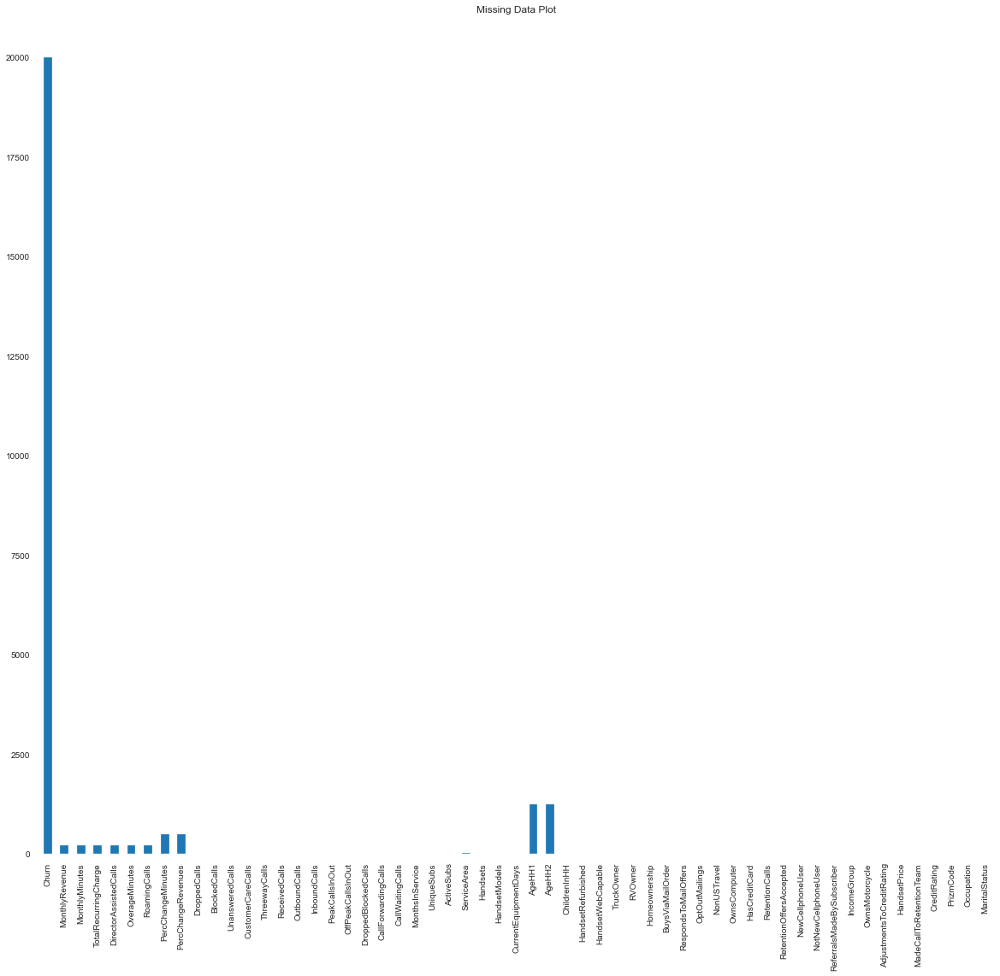

In [7]:
plt.figure(figsize = (20, 18))
churn_data.isna().sum().plot(kind = "bar")
print(churn_data.isna().sum())
plt.title("Missing Data Plot")

In [8]:
#churn_data.dropna(axis = 0, inplace = True)
churn_data.shape

(71047, 57)

In [9]:
def seperate(df):
    categorical, numerical = list(), list()
    for col, col_type in df.dtypes.iteritems():
        
        if col_type == 'O':
            categorical.append(col)
        else:
            numerical.append(col)
    return categorical, numerical

cat_cols, num_cols = seperate(churn_data.drop(["Churn"], axis = 1))
print(cat_cols)

['ServiceArea', 'ChildrenInHH', 'HandsetRefurbished', 'HandsetWebCapable', 'TruckOwner', 'RVOwner', 'Homeownership', 'BuysViaMailOrder', 'RespondsToMailOffers', 'OptOutMailings', 'NonUSTravel', 'OwnsComputer', 'HasCreditCard', 'NewCellphoneUser', 'NotNewCellphoneUser', 'OwnsMotorcycle', 'HandsetPrice', 'MadeCallToRetentionTeam', 'CreditRating', 'PrizmCode', 'Occupation', 'MaritalStatus']


In [10]:
print(num_cols)

['MonthlyRevenue', 'MonthlyMinutes', 'TotalRecurringCharge', 'DirectorAssistedCalls', 'OverageMinutes', 'RoamingCalls', 'PercChangeMinutes', 'PercChangeRevenues', 'DroppedCalls', 'BlockedCalls', 'UnansweredCalls', 'CustomerCareCalls', 'ThreewayCalls', 'ReceivedCalls', 'OutboundCalls', 'InboundCalls', 'PeakCallsInOut', 'OffPeakCallsInOut', 'DroppedBlockedCalls', 'CallForwardingCalls', 'CallWaitingCalls', 'MonthsInService', 'UniqueSubs', 'ActiveSubs', 'Handsets', 'HandsetModels', 'CurrentEquipmentDays', 'AgeHH1', 'AgeHH2', 'RetentionCalls', 'RetentionOffersAccepted', 'ReferralsMadeBySubscriber', 'IncomeGroup', 'AdjustmentsToCreditRating']


In [11]:
#sns.pairplot(churn_data)

In [12]:
# Customer attrition in the data

import warnings
warnings.filterwarnings("ignore")
import io
import plotly.offline as py#visualization
py.init_notebook_mode()#visualization
import plotly.graph_objs as go#visualization
import plotly.tools as tls#visualization
import plotly.figure_factory as ff#visualization
import os


lab = churn_data["Churn"].value_counts().keys().tolist()
val = churn_data["Churn"].value_counts().values.tolist()

trace = go.Pie(labels = lab ,
               values = val ,
               marker = dict(colors =  [ 'crimson' ,'lime'],
                             line = dict(color = "white",
                                         width =  1.3)
                            ),
               rotation = 90,
               hoverinfo = "label+value+text",
               hole = .5
              )
layout = go.Layout(dict(title = "Customer attrition in data",
                        plot_bgcolor  = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                       )
                  )

data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()

# Variable Distribution in customer Attrition

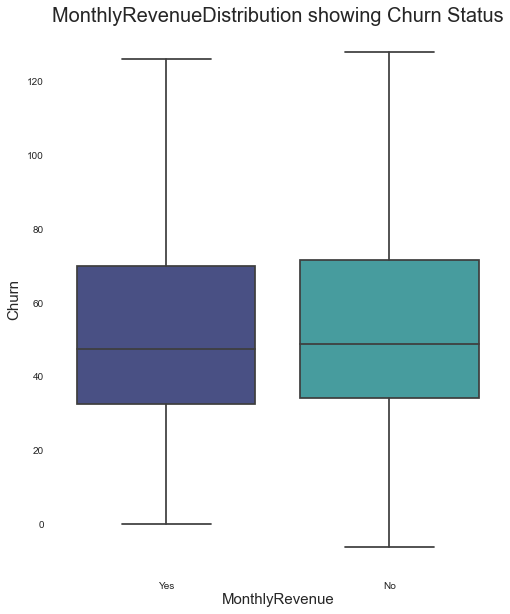

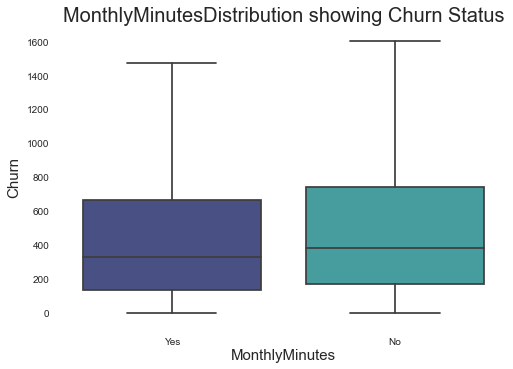

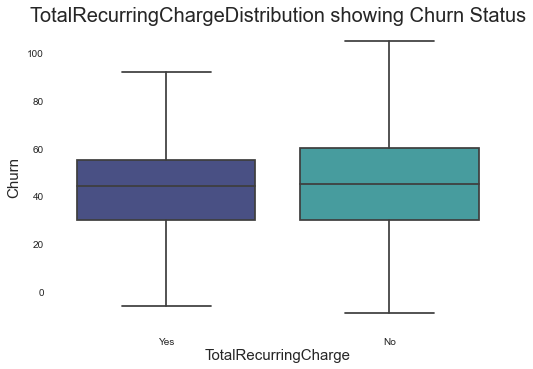

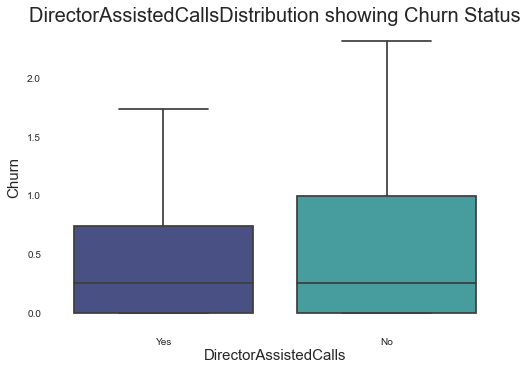

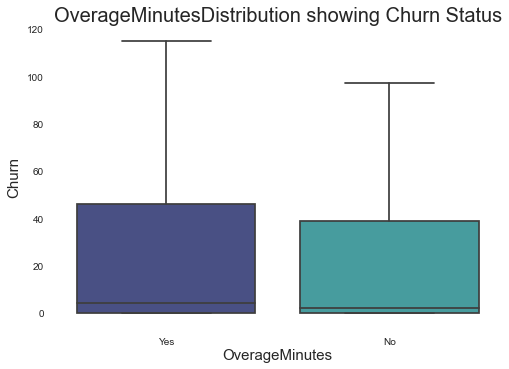

...

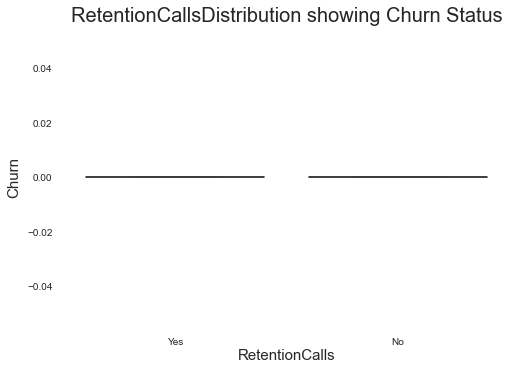

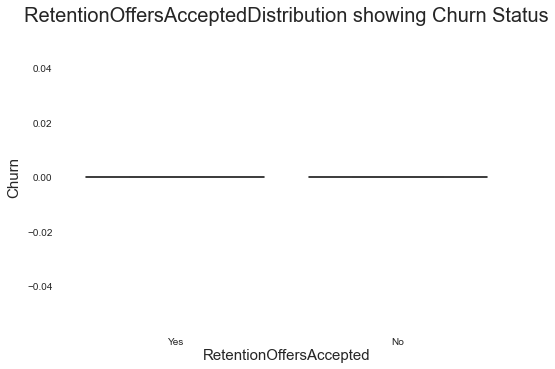

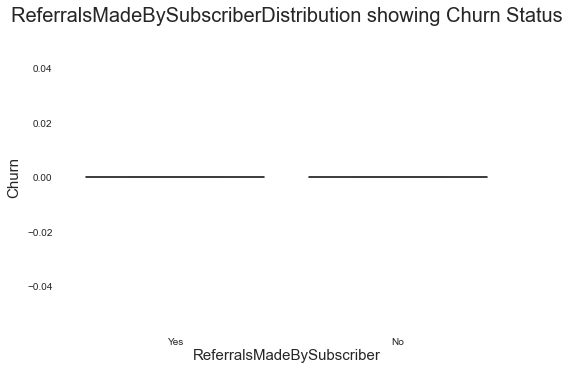

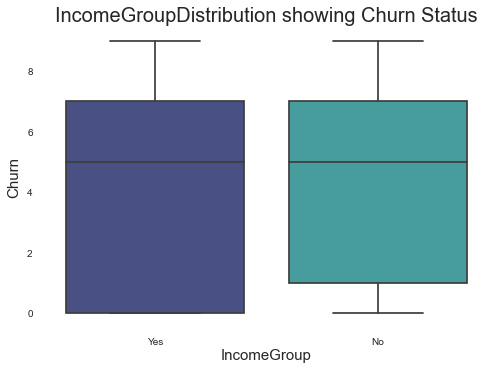

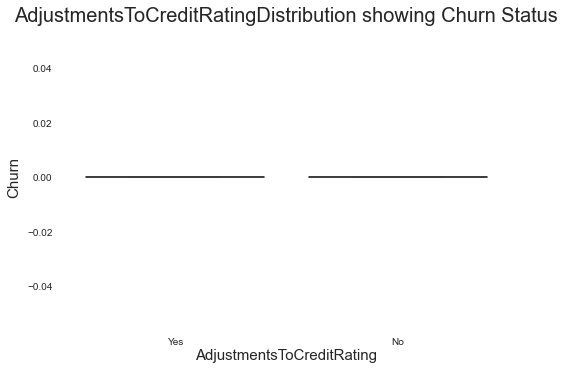

In [13]:
plt.figure(figsize=(8,10))

for k, i in enumerate(num_cols):
    sns.boxplot(x='Churn', y = i ,data=churn_data, palette='mako',showfliers=False)

    plt.xlabel(i, fontsize=15, labelpad=2)
    plt.ylabel('Churn', fontsize=15, labelpad=6)
    plt.title(i + 'Distribution showing Churn Status', fontsize=20, pad=6);
    plt.show()

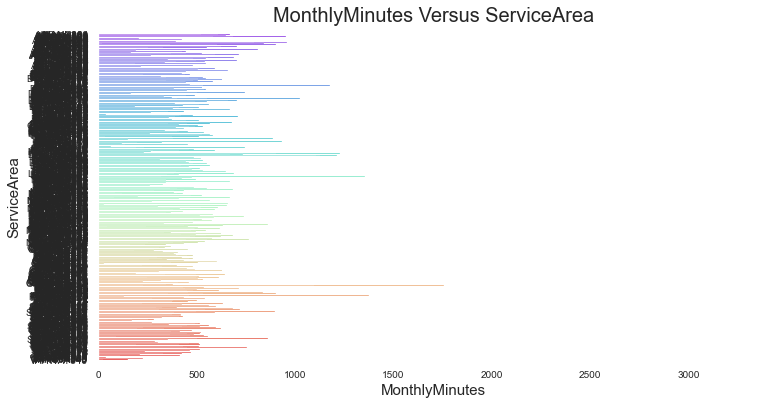

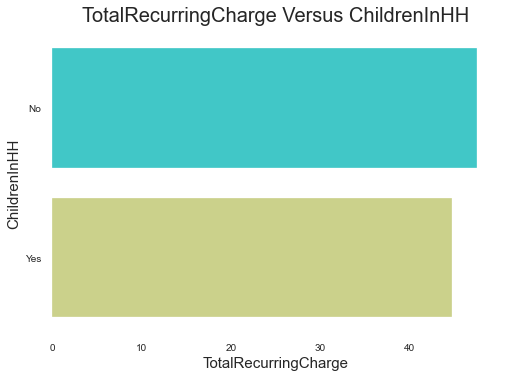

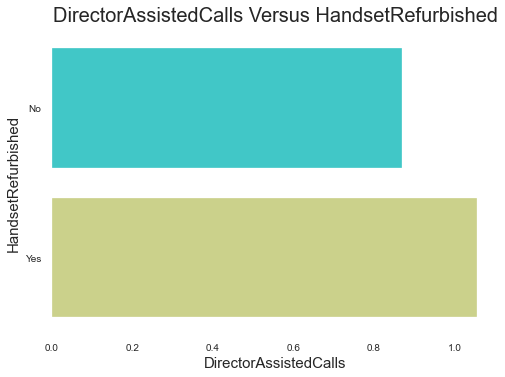

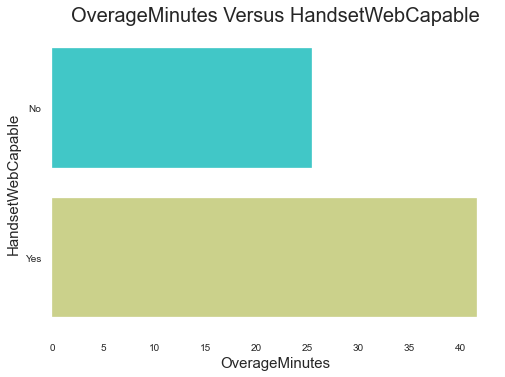

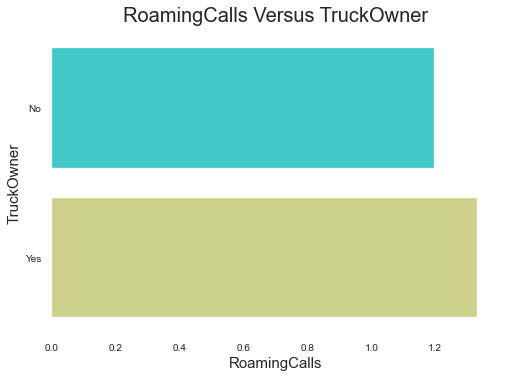

...

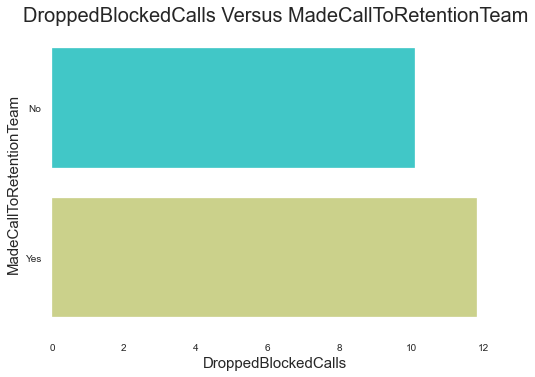

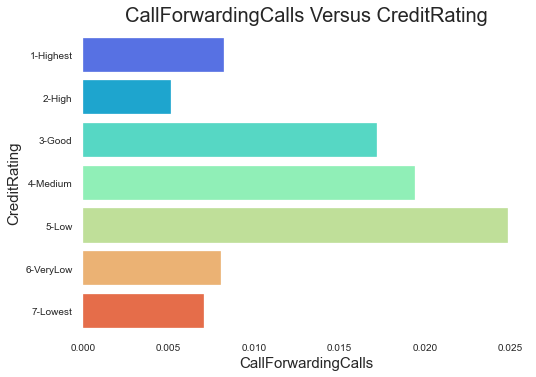

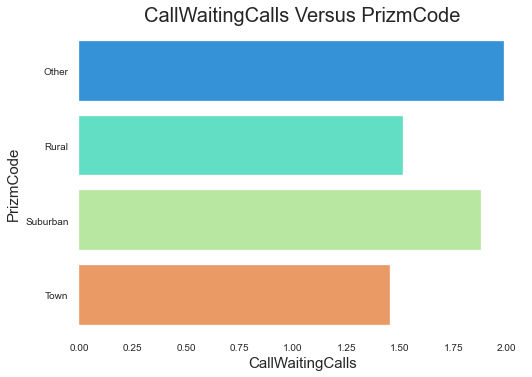

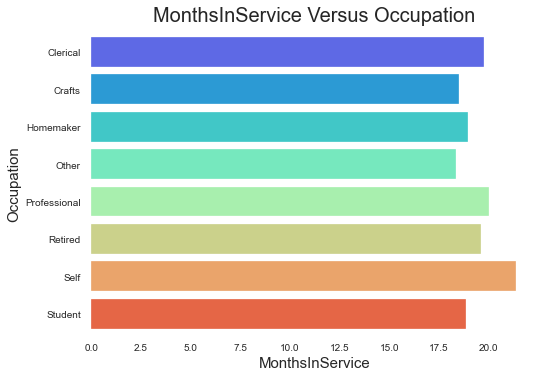

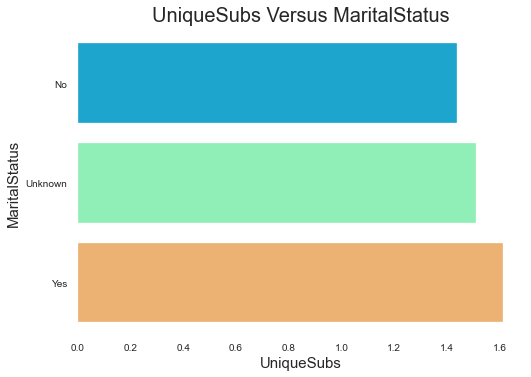

In [14]:
# On an average, interest rates are highest for clients seeking loans for medical reasons, 
# followed by business and other reasons
plt.figure(figsize=(12,6))
for i in range(len(cat_cols)):
    
    
    data = churn_data.groupby(cat_cols[i])[num_cols[i+1]].mean()

    sns.barplot(x=data.values, y=data.index, palette='rainbow')

    plt.xlabel(num_cols[i+1], fontsize=15)
    plt.ylabel(cat_cols[i], fontsize=15)
    plt.title(num_cols[i+1] + ' ' + 'Versus' + ' ' + cat_cols[i], fontsize=20, pad=12);
    plt.show()

In [15]:
#Statistical Distribution of Data
churn_data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
MonthlyRevenue,70831.0,58.852853,44.243566,-6.17,33.64,48.53,71.03,1223.38
MonthlyMinutes,70831.0,525.726250,530.136184,0.00,158.00,366.00,722.00,7668.00
TotalRecurringCharge,70831.0,46.862899,23.915000,-11.00,30.00,45.00,60.00,400.00
DirectorAssistedCalls,70831.0,0.894817,2.197577,0.00,0.00,0.25,0.99,159.39
OverageMinutes,70831.0,40.087730,96.349599,0.00,0.00,2.00,41.00,4321.00
RoamingCalls,70831.0,1.222315,9.081089,0.00,0.00,0.00,0.30,1112.40
PercChangeMinutes,70545.0,-10.845304,255.314034,-3875.00,-83.00,-5.00,66.00,5192.00
PercChangeRevenues,70545.0,-1.204730,38.770236,-1107.70,-7.10,-0.30,1.60,2483.50
DroppedCalls,71047.0,6.009567,9.006656,0.00,0.70,3.00,7.70,221.70
BlockedCalls,71047.0,4.066459,10.671180,0.00,0.00,1.00,3.70,384.30


# Data Pre-Processing
2. Handle Missing Values
3. Drop columns
4. One-hot encode categorical columns


In [16]:
print(churn_data.isna().sum())

Churn                        20000
MonthlyRevenue                 216
MonthlyMinutes                 216
TotalRecurringCharge           216
DirectorAssistedCalls          216
OverageMinutes                 216
RoamingCalls                   216
PercChangeMinutes              502
PercChangeRevenues             502
DroppedCalls                     0
BlockedCalls                     0
UnansweredCalls                  0
CustomerCareCalls                0
ThreewayCalls                    0
ReceivedCalls                    0
OutboundCalls                    0
InboundCalls                     0
PeakCallsInOut                   0
OffPeakCallsInOut                0
DroppedBlockedCalls              0
CallForwardingCalls              0
CallWaitingCalls                 0
MonthsInService                  0
UniqueSubs                       0
ActiveSubs                       0
ServiceArea                     28
Handsets                         1
HandsetModels                    1
CurrentEquipmentDays

### 2.1 Handle missing values in the `Monthly Revenue column`
- **`Fill Nans with Mean`**
- **Logic behind it**: missing values are filled in with **`mean of the column**; missing is being translated as **`unverified`**

In [17]:
churn_data['MonthlyMinutes'] = churn_data['MonthlyMinutes'].fillna(churn_data['MonthlyMinutes'].mean())
churn_data['MonthlyRevenue'] = churn_data['MonthlyRevenue'].fillna(churn_data['MonthlyRevenue'].mean())
#churn_data['DirectorAssistedCalls'] = churn_data['DirectorAssistedCalls'].fillna(churn_data['DirectorAssistedCalls'].mean())
churn_data['OverageMinutes'] = churn_data['OverageMinutes'].fillna(churn_data['OverageMinutes'].mean())
#churn_data['RoamingCalls'] = churn_data['RoamingCalls'].fillna(churn_data['RoamingCalls'].mean())
churn_data['PercChangeMinutes'] = churn_data['PercChangeMinutes'].fillna(churn_data['PercChangeMinutes'].mean())
churn_data['PercChangeRevenues'] = churn_data['PercChangeRevenues'].fillna(churn_data['PercChangeRevenues'].mean())

### 2.1 Handle missing values in the `Service Area column`
- **`Drop the feature`**
- **Logic behind it**:the service area feature is a column that is less unique, we have less use for it

In [18]:
churn_data = churn_data.drop(["ServiceArea"], axis = 1)

### Fill AgeHH1 with the mean

In [19]:
print(churn_data["AgeHH1"].describe().transpose())
print(churn_data["AgeHH1"].mode())

count    69803.000000
mean        31.375113
std         22.082195
min          0.000000
25%          0.000000
50%         36.000000
75%         48.000000
max         99.000000
Name: AgeHH1, dtype: float64
0    0.0
dtype: float64


In [20]:
churn_data["AgeHH1"] = churn_data["AgeHH1"].fillna(churn_data["AgeHH1"].mean())
churn_data["AgeHH2"] = churn_data["AgeHH2"].fillna(churn_data["AgeHH2"].mean())

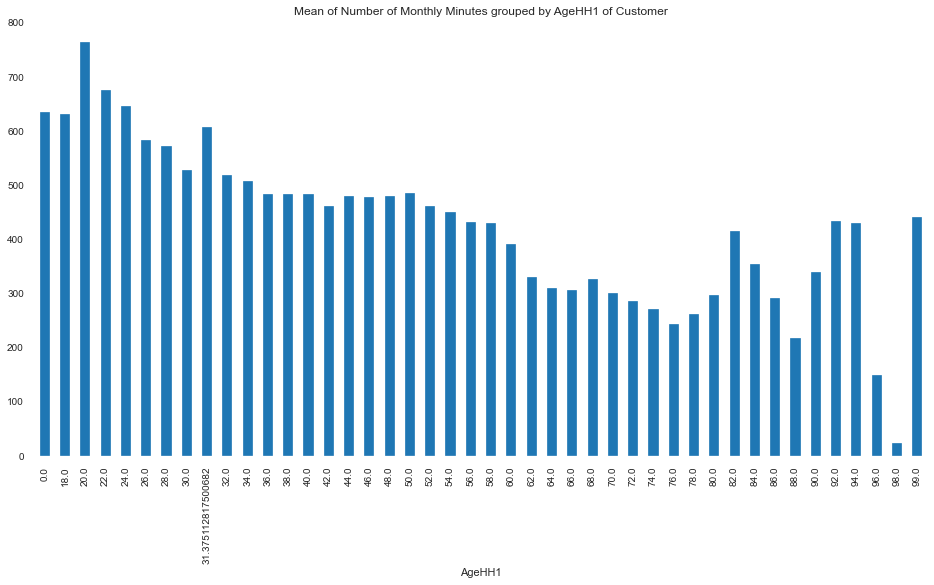

In [21]:
plt.figure(figsize=(16,8))
churn_data['MonthlyMinutes'].groupby(churn_data['AgeHH1']).mean().plot(kind='bar',
                    title= 'Mean of Number of Monthly Minutes grouped by AgeHH1 of Customer');

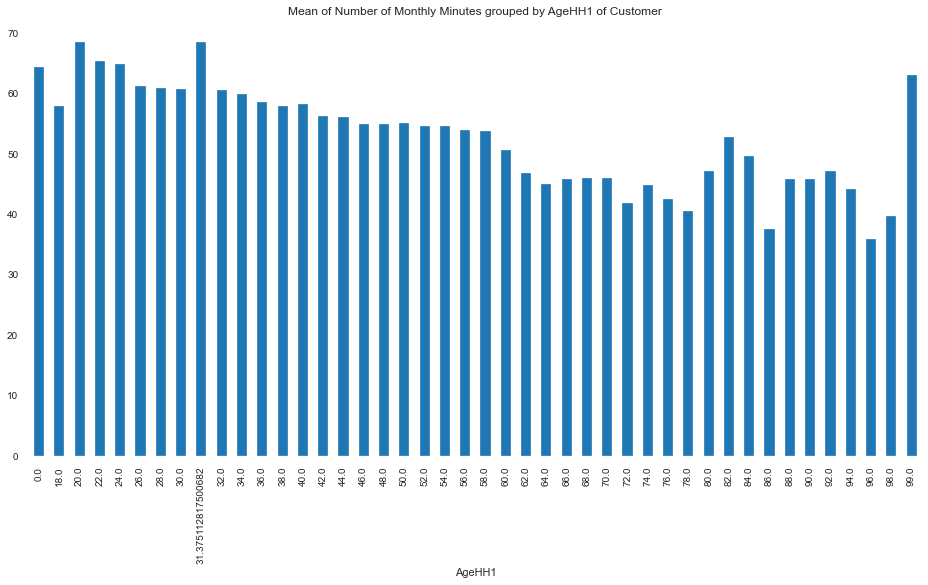

In [22]:
plt.figure(figsize=(16,8))
churn_data['MonthlyRevenue'].groupby(churn_data['AgeHH1']).mean().plot(kind='bar',
                    title= 'Mean of Number of Monthly Minutes grouped by AgeHH1 of Customer');

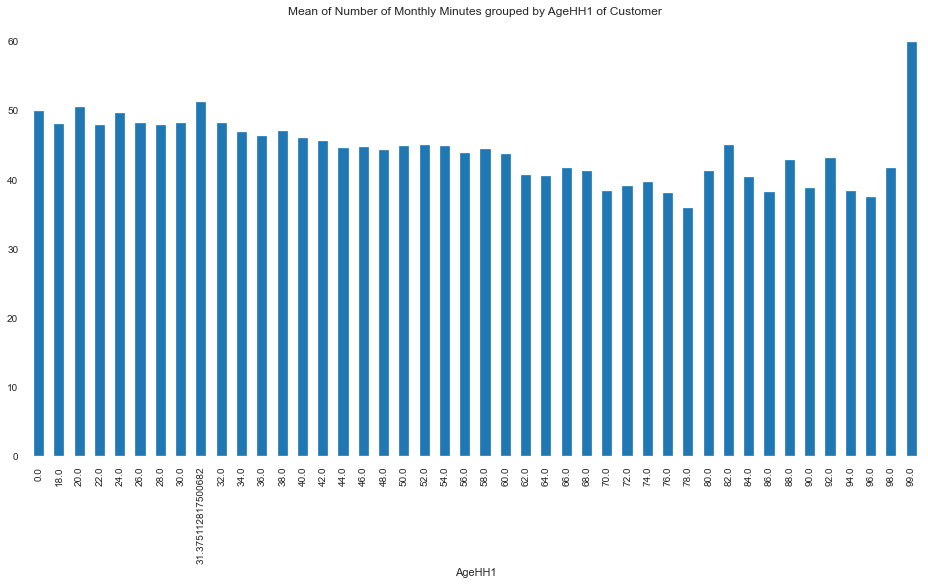

In [23]:
plt.figure(figsize=(16,8))
churn_data['TotalRecurringCharge'].groupby(churn_data['AgeHH1']).mean().plot(kind='bar',
                    title= 'Mean of Number of Monthly Minutes grouped by AgeHH1 of Customer');

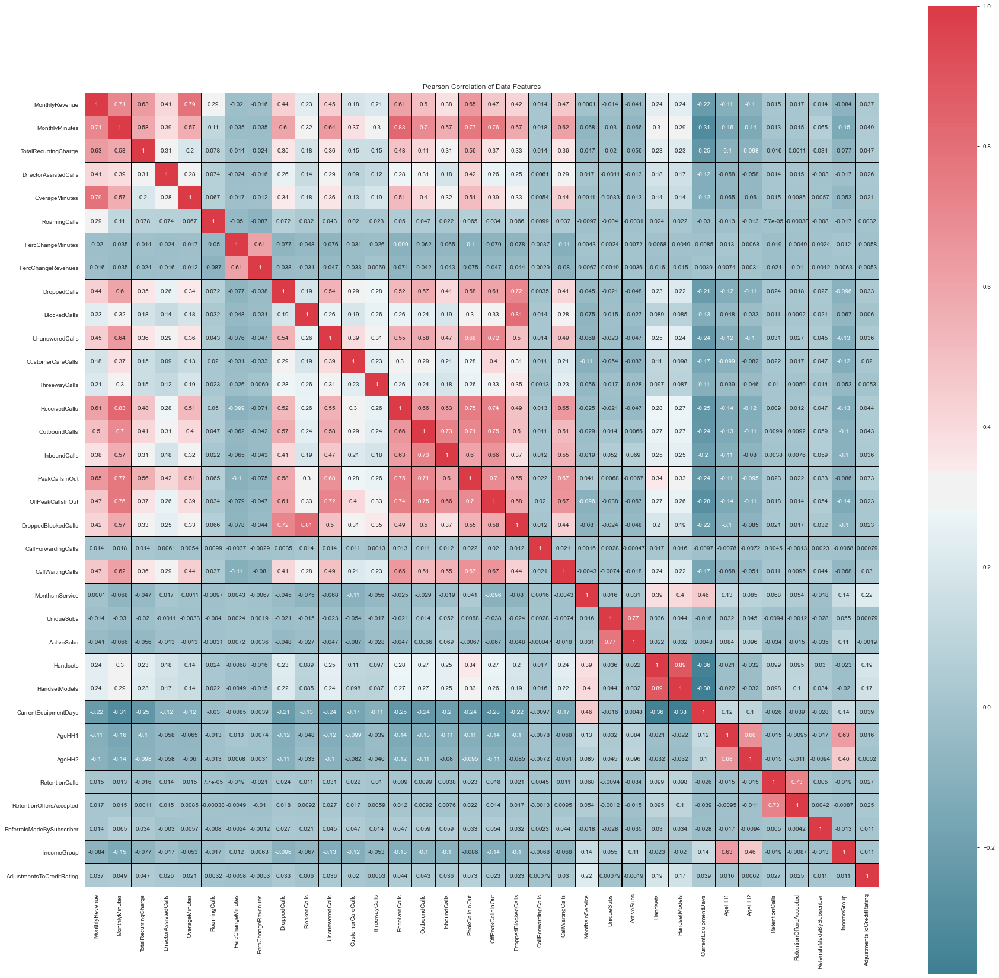

In [24]:
plt.figure(figsize=(30,30))
plt.title('Pearson Correlation of Data Features')
sns.heatmap(churn_data.corr(), linewidths=0.25, vmax=1.0, square=True,
           cmap=sns.diverging_palette(220, 10, as_cmap=True), linecolor='black', annot=True);

In [25]:
# drop the 20000 records
churn_data = churn_data.dropna(axis = 0);
churn_data.shape

(50890, 56)

## One Hot Encode Categorical Columns

In [26]:
from sklearn.preprocessing import StandardScaler
cat_cols_, _ = seperate(churn_data.drop(["Churn"], axis = 1))
ohe_cols = pd.get_dummies(churn_data[cat_cols_])
ohe_churn = pd.concat([churn_data, ohe_cols], axis = 1)
ohe_churn = ohe_churn.drop(cat_cols_, axis = 1)

scale = StandardScaler()
ohe_churn[_] = scale.fit_transform(ohe_churn[_])

In [27]:
ohe_churn.head()

,Churn,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,...,Occupation_Crafts,Occupation_Homemaker,Occupation_Other,Occupation_Professional,Occupation_Retired,Occupation_Self,Occupation_Student,MaritalStatus_No,MaritalStatus_Unknown,MaritalStatus_Yes
CustomerID,,,,,,,,,,,,,,,,,,,,,
3000002,Yes,-0.782662,-0.578757,-1.041139,-0.289537,-0.414426,-0.125915,-0.566015,-0.450916,-0.587828,...,0,0,0,1,0,0,0,1,0,0
3000010,Yes,-0.940164,-0.973197,-1.250798,-0.401718,-0.414426,-0.125915,0.029361,0.030184,-0.632052,...,0,0,0,1,0,0,0,0,0,1
3000014,No,-0.468106,-0.976971,-0.370229,-0.401718,-0.414426,-0.125915,0.037144,0.030184,-0.665220,...,1,0,0,0,0,0,0,0,0,1
3000022,No,0.526787,1.484029,1.181250,0.154699,-0.414426,-0.125915,0.655868,0.235285,5.083904,...,0,0,1,0,0,0,0,1,0,0
3000026,Yes,-0.936794,-0.992069,-1.250798,-0.401718,-0.414426,-0.125915,0.044926,0.025120,-0.665220,...,0,0,0,1,0,0,0,0,0,1


In [28]:
#saved transformed data
X_df = ohe_churn.copy()

In [29]:
X = ohe_churn.drop(["Churn"], axis = 1)
y = ohe_churn['Churn']
print(X.shape)
print(y.shape)

# Labeling our target feature, Yes:0, No:1
from sklearn.preprocessing import LabelEncoder
label = LabelEncoder()

y = label.fit_transform(y)
print(y)

(50890, 104)
(50890,)
[1 1 0 ... 0 1 0]


## Use an ExtraTreeClassifier to find most important features

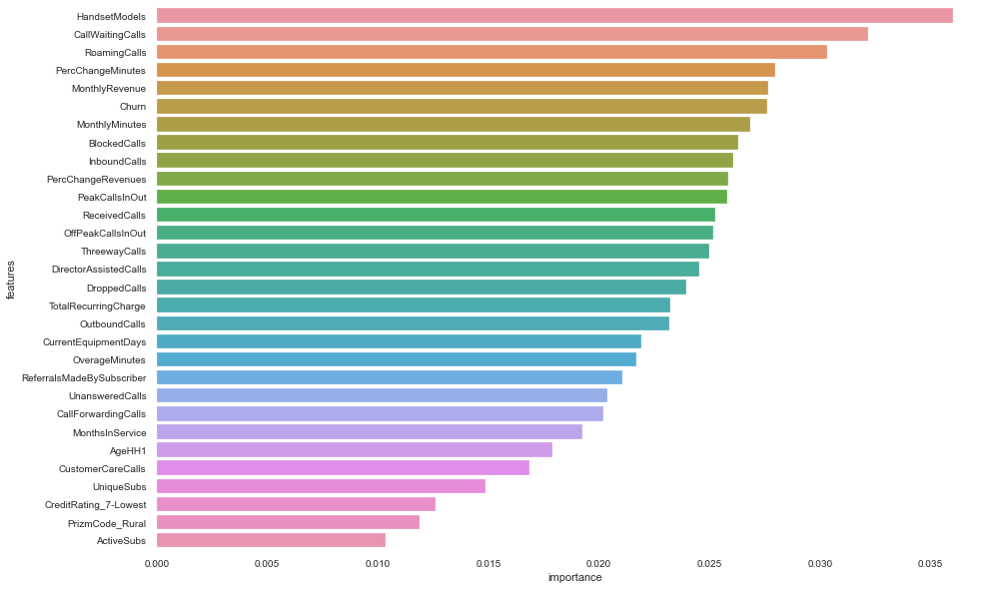

In [30]:
from sklearn.datasets import make_classification
from sklearn.ensemble import ExtraTreesClassifier

# Initialize a random forest estimator
forest = ExtraTreesClassifier(n_estimators=50,random_state=0)

# Fit the input matrix and target values to the classifier
forest.fit(X, y)

# Retrieve the computed feature importance
importances = forest.feature_importances_

# Plot the feature importance
plot_data = pd.DataFrame({'features' : pd.Series(X_df.columns),'importance' : pd.Series(importances)})
plt.figure(figsize=(15,10))
plot_data = plot_data.sort_values('importance',ascending=False)
plot_data = plot_data[plot_data['importance'] > 0.01] # select only features greater than 0.01
ax = sns.barplot(x=plot_data['importance'],y=plot_data['features'],)

In [31]:
# Use the most important features [mif] as X
mifeat_df_X = ohe_churn[plot_data.iloc[:,0].values]
mifeat_df_X = mifeat_df_X.drop(["Churn"], axis = 1)
#mifeat_df_X.columns.tolist()

In [32]:
# Split data
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(mifeat_df_X, y, test_size=0.30, random_state = 2)

#  Model Building
## Baseline Model

In [59]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
from sklearn.metrics import roc_auc_score,roc_curve,scorer
from sklearn.metrics import f1_score, precision_score
import statsmodels.api as sm
from sklearn.metrics import precision_score,recall_score
from yellowbrick.classifier import DiscriminationThreshold
import pickle
import joblib


##seperating dependent and independent variables
cols    = [i for i in mifeat_df_X.columns]


    
def churn_prediction(algorithm,training_x,testing_x,
                             training_y,testing_y,cols,cf,threshold_plot, model_name = "model.sav") :
    
    #model
    algorithm.fit(training_x, training_y)
    predictions   = algorithm.predict(testing_x)
    probabilities = algorithm.predict_proba(testing_x)  
    #features = list(training_x.columns)
    #print(features)
    joblib.dump(algorithm, "model.pkl")
    #joblib.dump(features, "features.pkl")
    
    #coeffs
    if   cf == "coefficients" : # use weight
        coefficients  = pd.DataFrame(algorithm.coef_.ravel())
    elif cf == "features" :    # assign scores to features/feature weight
        coefficients  = pd.DataFrame(algorithm.feature_importances_)
        
    column_df     = pd.DataFrame(cols)
    coef_sumry    = (pd.merge(coefficients,column_df,left_index= True,
                              right_index= True, how = "left"))
    coef_sumry.columns = ["coefficients","features"]
    coef_sumry    = coef_sumry.sort_values(by = "coefficients",ascending = False)
    
    print (algorithm)
    print ("\n Classification report : \n",classification_report(testing_y,predictions))
    print ("Accuracy Score : ",accuracy_score(testing_y,predictions))
    print("F1 Score: {}".format(f1_score(testing_y, predictions)))
    print("precision Score: {}".format(precision_score(testing_y, predictions)))
    #confusion matrix
    conf_matrix = confusion_matrix(testing_y,predictions)
    c = np.array([[0, 0], [0, 0]])
    c[1], c[0] = conf_matrix[0], conf_matrix[1]
    print(conf_matrix)
    #roc_auc_score
    model_roc_auc = roc_auc_score(testing_y,predictions) 
    print ("Area under curve : ",model_roc_auc,"\n")
    fpr,tpr,thresholds = roc_curve(testing_y,probabilities[:,1])
    
    #plot confusion matrix
    trace1 = go.Heatmap(z = c ,
                        x = ["Not churn","Churn"],
                        y = ["Not churn","Churn"],
                        showscale  = False,
                        name = "confusion matrix")
    
    #plot roc curve
    trace2 = go.Scatter(x = fpr,
                        y = tpr,
                        name = "Roc : " + str(model_roc_auc),
                        line = dict(color = ('rgb(22, 96, 167)'),width = 2))
    trace3 = go.Scatter(x = [0,1],y=[0,1],
                        line = dict(color = ('rgb(205, 12, 24)'),width = 2,
                        dash = 'dot'))
    
    #plot coeffs
    trace4 = go.Bar(x = coef_sumry["features"],y = coef_sumry["coefficients"],
                    name = "coefficients",
                    marker = dict(color = coef_sumry["coefficients"],
                                  colorscale = "Picnic",
                                  line = dict(width = .6,color = "black")))
    
    #subplots
    fig = tls.make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 2}, None]],
                            subplot_titles=('Confusion Matrix',
                                            'Receiver operating characteristic',
                                            'Feature Importances'))
    
    fig.append_trace(trace1,1,1)
    fig.append_trace(trace2,1,2)
    fig.append_trace(trace3,1,2)
    fig.append_trace(trace4,2,1)
    
    fig['layout'].update(showlegend=False, title="Model performance" ,
                         autosize = False,height = 900,width = 800,
                         plot_bgcolor = 'rgba(240,240,240, 0.95)',
                         paper_bgcolor = 'rgba(240,240,240, 0.95)',
                         margin = dict(b = 195))
    fig["layout"]["xaxis2"].update(dict(title = "false positive rate"))
    fig["layout"]["yaxis2"].update(dict(title = "true positive rate"))
    fig["layout"]["xaxis3"].update(dict(showgrid = True,tickfont = dict(size = 10),
                                        tickangle = 90))
    py.iplot(fig)
    
    if threshold_plot == True : 
        visualizer = DiscriminationThreshold(algorithm)
        visualizer.fit(training_x,training_y)
        visualizer.poof()
        
logit  = LogisticRegression(C=0.1, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

churn_prediction(logit,X_train,X_test,y_train,y_test,
                         cols,"coefficients",threshold_plot = False)

LogisticRegression(C=0.1, multi_class='ovr', n_jobs=1, solver='liblinear')

 Classification report : 
               precision    recall  f1-score   support

           0       0.72      0.99      0.83     10922
           1       0.40      0.01      0.02      4345

    accuracy                           0.71     15267
   macro avg       0.56      0.50      0.43     15267
weighted avg       0.63      0.71      0.60     15267

Accuracy Score :  0.713565205999869
F1 Score: 0.024101762999330506
precision Score: 0.39705882352941174
[[10840    82]
 [ 4291    54]]
Area under curve :  0.5024601478967188 



C:\Users\ajayi\anaconda3\lib\site-packages\plotly\tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



## Synthetic Minority Oversampling TEchnique (SMOTE)
* Randomly pick a point from the minority class.
* Compute the k-nearest neighbors (for some pre-specified k) for this point.
* Add k new points somewhere between the chosen point and each of its neighbors

In [60]:
#!pip uninstall imblearn

In [61]:
from imblearn.over_sampling import SMOTE
from sklearn.metrics import f1_score

smote = SMOTE(random_state=3005, sampling_strategy = 'minority')
X_train_bal, y_train_bal = smote.fit_sample(X_train, y_train) # balancing the classes
X_train_bal = pd.DataFrame(X_train_bal, columns = list(mifeat_df_X.columns))
y_train_bal = pd.DataFrame(y_train_bal, columns = ["Churn"])


logit_smote  = LogisticRegression(C=0.1, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

churn_prediction(logit_smote,X_train_bal,X_test,y_train_bal,y_test,
                         cols,"coefficients",threshold_plot = False)

LogisticRegression(C=0.1, multi_class='ovr', n_jobs=1, solver='liblinear')

 Classification report : 
               precision    recall  f1-score   support

           0       0.77      0.56      0.65     10922
           1       0.35      0.58      0.43      4345

    accuracy                           0.57     15267
   macro avg       0.56      0.57      0.54     15267
weighted avg       0.65      0.57      0.59     15267

Accuracy Score :  0.5673020239732757
F1 Score: 0.4327666151468315
precision Score: 0.3451581975071908
[[6141 4781]
 [1825 2520]]
Area under curve :  0.571118322221658 



C:\Users\ajayi\anaconda3\lib\site-packages\plotly\tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



## <a id='5.3'>5.3. Recursive Feature Elimination</a>
Recursive Feature Elimination (RFE) is based on the idea to repeatedly construct a model and choose either the best or worst performing feature, setting the feature aside and then repeating the process with the rest of the features. This process is applied until all features in the dataset are exhausted. The goal of RFE is to select features by recursively considering smaller and smaller sets of features.

In [62]:
from sklearn.feature_selection import RFE

logit = LogisticRegression()

rfe = RFE(logit,10)
rfe = rfe.fit(X_train_bal,y_train_bal)

rfe.support_
rfe.ranking_

#identified columns Recursive Feature Elimination
idc_rfe = pd.DataFrame({"rfe_support" :rfe.support_,
                       "columns" : [i for i in mifeat_df_X.columns],
                       "ranking" : rfe.ranking_,
                      })
cols = idc_rfe[idc_rfe["rfe_support"] == True]["columns"].tolist()


#separating train and test data
train_rf_X = X_train_bal
train_rf_Y = y_train_bal
test_rf_X  = X_test
test_rf_Y  = y_test
print(train_rf_X.shape)

logit_rfe = LogisticRegression(C=0.1, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

#applying model
churn_prediction(logit_rfe,train_rf_X,test_rf_X,train_rf_Y,test_rf_Y,
                         cols,"coefficients",threshold_plot = False)

tab_rk = ff.create_table(idc_rfe)
py.iplot(tab_rk)

(50654, 29)
LogisticRegression(C=0.1, multi_class='ovr', n_jobs=1, solver='liblinear')

 Classification report : 
               precision    recall  f1-score   support

           0       0.77      0.56      0.65     10922
           1       0.35      0.58      0.43      4345

    accuracy                           0.57     15267
   macro avg       0.56      0.57      0.54     15267
weighted avg       0.65      0.57      0.59     15267

Accuracy Score :  0.5673020239732757
F1 Score: 0.4327666151468315
precision Score: 0.3451581975071908
[[6141 4781]
 [1825 2520]]
Area under curve :  0.571118322221658 



C:\Users\ajayi\anaconda3\lib\site-packages\plotly\tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



In [ ]:
!pip install graphviz

DecisionTreeClassifier(max_depth=9)

 Classification report : 
               precision    recall  f1-score   support

           0       0.76      0.65      0.70     10922
           1       0.36      0.49      0.41      4345

    accuracy                           0.60     15267
   macro avg       0.56      0.57      0.56     15267
weighted avg       0.65      0.60      0.62     15267

Accuracy Score :  0.604702954083972
F1 Score: 0.4148162513332687
precision Score: 0.35841152815013405
[[7093 3829]
 [2206 2139]]
Area under curve :  0.5708565855299078 



C:\Users\ajayi\anaconda3\lib\site-packages\plotly\tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



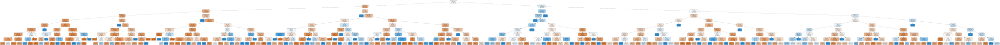

In [65]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn import tree
from graphviz import Source
from IPython.display import SVG,display
from subprocess import call

features = list(mifeat_df_X.columns)
def plot_decision_tree(train_X, train_Y, test_X, test_Y,columns,maximum_depth,criterion_type,
                       split_type,model_performance = None):
    

    
    #model
    dt_classifier = DecisionTreeClassifier(max_depth = maximum_depth,
                                           splitter  = split_type,
                                           criterion = criterion_type,
                                          )
    dt_classifier.fit(train_X, train_Y)
    
    #plot decision tree
    graph = Source(tree.export_graphviz(dt_classifier,
                                        rounded=True,proportion = False,
                                        feature_names = columns, 
                                        precision  = 2,
                                        class_names=["Not churn","Churn"],
                                        filled = True, out_file = None                         
                                       )
                  )
    
    graph.render("tree.pdf", view = True)
    
    #model performance
    if model_performance == True :
        churn_prediction(dt_classifier, X_train_bal,test_X,
                                 train_Y,test_Y,
                                 columns,"features",threshold_plot = False)
    display(graph)
    
plot_decision_tree(X_train_bal, y_train_bal, X_test, y_test, features, 9, "gini", "best", model_performance = True)

## <a id='5.8'>5.8. A random forest classifier.</a>
* A random forest is a meta estimator that fits a number of decision tree classifiers on various sub-samples of the dataset and use averaging to improve the predictive accuracy and control over-fitting. The sub-sample size is always the same as the original input sample size but the samples are drawn with replacement .
* Below are the trees produced by random forest model with 10 estimated trees with maximum depth of three  for each tree. Each tree produced is slightly different from other.

In [66]:
#from sklearn.ensemble import RandomForestClassifier
#from xgboost import XGBClassifier
#function attributes
#columns  - column used
#nf_estimators   - The number of trees in the forest.
#estimated_tree  - tree number to be displayed
#maximum_depth   - depth of the tree
#criterion_type  - split criterion type ["gini" or "entropy"]
#Model performance - prints performance of model
from sklearn.tree import export_graphviz
from sklearn import tree
features = list(mifeat_df_X.columns)
def plot_tree_randomforest(train_X, train_Y, test_X, test_Y, columns,nf_estimators,
                           estimated_tree,maximum_depth,
                           criterion_type,model_performance = None) :
    
    
    #train and test datasets
    rf_x     = train_X
    rf_y     = train_Y
    
    #random forest classifier
    rfc   = RandomForestClassifier(n_estimators = nf_estimators,
                                   max_depth = maximum_depth,
                                   criterion = criterion_type,
                                  )
    rfc.fit(rf_x,rf_y)
    
    
    #estimated_tree = rfc.estimators_[estimated_tree]
    #fig, axes = plt.subplots(nrows = 1, ncols = 10, figsize = (10, 2), dpi = 900)
    #for index in range(0, 10):
     #   graph = tree.plot_tree(rfc.estimators_[0], feature_names = mifeat_df_X.columns, class_names=["Not churn","Churn"],filled = True, rounded = True, ax = axes[index])
     #   axes[index].set_title("Estimator:" + str(index), fontsize = 11)
    #fig.savefig('random.png')
    #graph.render("random.pdf")
    #display(graph)
    
    #model performance
    if model_performance == True :
        churn_prediction(rfc,
                                 rf_x,test_X,
                                 rf_y,test_Y,
                                 columns,"features",threshold_plot = False)
        


plot_tree_randomforest(X_train_bal, y_train_bal, X_test, y_test, features,100,99,10,"entropy",True)

RandomForestClassifier(criterion='entropy', max_depth=10)

 Classification report : 
               precision    recall  f1-score   support

           0       0.77      0.73      0.75     10922
           1       0.39      0.44      0.41      4345

    accuracy                           0.65     15267
   macro avg       0.58      0.58      0.58     15267
weighted avg       0.66      0.65      0.65     15267

Accuracy Score :  0.6482609550009825
F1 Score: 0.41426701570680635
precision Score: 0.3937383371345636
[[7998 2924]
 [2446 1899]]
Area under curve :  0.5846687748611401 



C:\Users\ajayi\anaconda3\lib\site-packages\plotly\tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



### Artificial Neural Networks

In [67]:
# Create a Densely connected neural network, initiate early stopping to prevent overfitting to training data
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow as tf
np.random.seed(7)

config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
session =tf.compat.v1.InteractiveSession(config=config)

classifier = Sequential()
classifier.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
classifier.add(Dense(1, activation='sigmoid'))
classifier.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

classifier.fit(
    X_train_bal, 
    y_train_bal, 
    epochs=10, 
    batch_size=16, 
    callbacks=[EarlyStopping(monitor='acc')])

Epoch 1/10
3166/3166 [==============================] - 7s 2ms/step - loss: 0.6754 - accuracy: 0.5802
Epoch 2/10
3166/3166 [==============================] - 6s 2ms/step - loss: 0.6627 - accuracy: 0.6002
Epoch 3/10
3166/3166 [==============================] - 7s 2ms/step - loss: 0.6568 - accuracy: 0.6098
Epoch 4/10
3166/3166 [==============================] - 7s 2ms/step - loss: 0.6515 - accuracy: 0.6194
Epoch 5/10
3166/3166 [==============================] - 7s 2ms/step - loss: 0.6459 - accuracy: 0.6263
Epoch 6/10
3166/3166 [==============================] - 7s 2ms/step - loss: 0.6411 - accuracy: 0.6332
Epoch 7/10
3166/3166 [==============================] - 7s 2ms/step - loss: 0.6386 - accuracy: 0.6339
Epoch 8/10
3166/3166 [==============================] - 7s 2ms/step - loss: 0.6352 - accuracy: 0.6397
Epoch 9/10
3166/3166 [==============================] - 7s 2ms/step - loss: 0.6324 - accuracy: 0.6431
Epoch 10/10
3166/3166 [==============================] - 7s 2ms/step - loss: 0.630

In [68]:
# helper function for the artificial neural network
def churn_prediction_nn(algorithm,training_x,testing_x,
                             training_y,testing_y,cols):
    
    #model
    algorithm.fit(training_x,training_y)
    predictions   = algorithm.predict(testing_x).ravel()
    probabilities = algorithm.predict_proba(testing_x)
    #features = list(training_x.columns)
    #print(features)
    #joblib.dump(algorithm, "model.pkl")
    #joblib.dump(features, "features.pkl")
    
    print (algorithm)
    print ("\n Classification report : \n",classification_report(testing_y,predictions > 0.5))
    print ("Accuracy   Score : ",accuracy_score(testing_y,predictions > 0.5))
    print("F1 Score: {}".format(f1_score(testing_y, predictions > 0.5)))
    print("precision Score: {}".format(precision_score(testing_y, predictions > 0.5)))
    #confusion matrix
    conf_matrix = confusion_matrix(testing_y,predictions > 0.5)
    c = np.array([[0, 0], [0, 0]])
    c[1], c[0] = conf_matrix[0], conf_matrix[1]
    print(conf_matrix)
    #roc_auc_score
    model_roc_auc = roc_auc_score(testing_y,predictions) 
    print ("Area under curve : ",model_roc_auc,"\n")
    fpr,tpr,thresholds = roc_curve(testing_y,probabilities)
    
    #plot confusion matrix
    trace1 = go.Heatmap(z = c ,
                        x = ["Not churn","Churn"],
                        y = ["Not churn","Churn"],
                        showscale  = False,
                        name = "confusion matrix")
    
    #plot roc curve
    trace2 = go.Scatter(x = fpr,y = tpr,
                        name = "Roc : " + str(model_roc_auc),
                        line = dict(color = ('rgb(22, 96, 167)'),width = 2))
    trace3 = go.Scatter(x = [0,1],y=[0,1],
                        line = dict(color = ('rgb(205, 12, 24)'),width = 2,
                        dash = 'dot'))
    
    #subplots
    fig = tls.make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 2}, None]],
                            subplot_titles=('Confusion Matrix',
                                            'Receiver operating characteristic'))
    
    fig.append_trace(trace1,1,1)
    fig.append_trace(trace2,1,2)
    fig.append_trace(trace3,1,2)
    
    fig['layout'].update(showlegend=False, title="Model performance" ,
                         autosize = False,height = 900,width = 800,
                         plot_bgcolor = 'rgba(240,240,240, 0.95)',
                         paper_bgcolor = 'rgba(240,240,240, 0.95)',
                         margin = dict(b = 195))
    fig["layout"]["xaxis2"].update(dict(title = "false positive rate"))
    fig["layout"]["yaxis2"].update(dict(title = "true positive rate"))
    fig["layout"]["xaxis3"].update(dict(showgrid = True,tickfont = dict(size = 10),
                                        tickangle = 90))
    py.iplot(fig)
    
        
churn_prediction_nn(classifier, X_train_bal,X_test,y_train_bal,y_test,
                         cols)

1583/1583 [==============================] - 3s 2ms/step - loss: 0.6242 - accuracy: 0.6520
Instructions for updating:
Please use `model.predict()` instead.

 Classification report : 
               precision    recall  f1-score   support

           0       0.79      0.59      0.68     10922
           1       0.37      0.60      0.46      4345

    accuracy                           0.59     15267
   macro avg       0.58      0.60      0.57     15267
weighted avg       0.67      0.59      0.61     15267

Accuracy   Score :  0.5942883343158446
F1 Score: 0.4581875437368789
precision Score: 0.3695498800620855
[[6454 4468]
 [1726 2619]]
Area under curve :  0.6353823608308228 



C:\Users\ajayi\anaconda3\lib\site-packages\plotly\tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



## Hyperparameter Tunning For RandomForest

* Remove from markdown to use

#  Model Performances
## model performance metrics

In [69]:
from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score

#gives model report in dataframe
def model_report(model,training_x,testing_x,training_y,testing_y,name) :
    if name == "NN":
        
        model.fit(training_x,training_y)
        predictions  = model.predict(testing_x)
        accuracy     = accuracy_score(testing_y,predictions > 0.5)
        recallscore  = recall_score(testing_y,predictions >0.5)
        precision    = precision_score(testing_y,predictions>0.5)
        roc_auc      = roc_auc_score(testing_y,predictions>0.5)
        f1score      = f1_score(testing_y,predictions>0.5) 
        kappa_metric = cohen_kappa_score(testing_y,predictions>0.5)
    else:
        model.fit(training_x,training_y)
        predictions  = model.predict(testing_x)
        accuracy     = accuracy_score(testing_y,predictions)
        recallscore  = recall_score(testing_y,predictions)
        precision    = precision_score(testing_y,predictions)
        roc_auc      = roc_auc_score(testing_y,predictions)
        f1score      = f1_score(testing_y,predictions) 
        kappa_metric = cohen_kappa_score(testing_y,predictions)

    df = pd.DataFrame({"Model"           : [name],
                       "Accuracy_score"  : [accuracy],
                       "Recall_score"    : [recallscore],
                       "Precision"       : [precision],
                       "f1_score"        : [f1score],
                       "Area_under_curve": [roc_auc],
                       "Kappa_metric"    : [kappa_metric],
                      })
    return df

#outputs for every model
model1 = model_report(logit,X_train,X_test,y_train,y_test,
                      "Logistic Regression(Baseline_model)")
model2 = model_report(logit_smote,X_train_bal,X_test,y_train_bal,y_test,
                      "Logistic Regression(SMOTE)")
model3 = model_report(logit_rfe,X_train_bal,X_test,y_train_bal,y_test,
                      "Logistic Regression(RFE)")
decision_tree = DecisionTreeClassifier(max_depth = 9,
                                       random_state = 123,
                                       splitter  = "best",
                                       criterion = "gini",
                                      )
model4 = model_report(decision_tree,X_train_bal,X_test,y_train_bal,y_test,
                      "Decision Tree")

rfc = RandomForestClassifier(n_estimators = 1000,
                             random_state = 123,
                             max_depth = 9,
                             criterion = "gini")
model5 = model_report(rfc,X_train_bal,X_test,y_train_bal,y_test,
                      "Random Forest Classifier")
#model6 = model_report(svc_lin,X_train_bal,X_test,y_train_bal,y_test,
                  #    "SVM Classifier Linear")
model7 = model_report(classifier, X_train_bal,X_test,y_train_bal,y_test, "NN") #  "ANN"

#concat all models
model_performances = pd.concat([model1,model2,model3,
                                model4,model5, model7],axis = 0).reset_index()

model_performances = model_performances.drop(columns = "index",axis =1)

table  = ff.create_table(np.round(model_performances,4))

py.iplot(table)

1583/1583 [==============================] - 4s 2ms/step - loss: 0.6238 - accuracy: 0.6525


## <a id='6.2'>6.2. Compare model metrics</a>

In [45]:
model_performances
def output_tracer(metric,color) :
    tracer = go.Bar(y = model_performances["Model"] ,
                    x = model_performances[metric],
                    orientation = "h",name = metric ,
                    marker = dict(line = dict(width =.7),
                                  color = color)
                   )
    return tracer

layout = go.Layout(dict(title = "Model performances",
                        plot_bgcolor  = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                        xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = "metric",
                                     zerolinewidth=1,
                                     ticklen=5,gridwidth=2),
                        yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                        margin = dict(l = 250),
                        height = 780
                       )
                  )


trace1  = output_tracer("Accuracy_score","#6699FF")
trace2  = output_tracer('Recall_score',"red")
trace3  = output_tracer('Precision',"#33CC99")
trace4  = output_tracer('f1_score',"lightgrey")
trace5  = output_tracer('Kappa_metric',"#FFCC99")

data = [trace1,trace2,trace3,trace4,trace5]
fig = go.Figure(data=data,layout=layout)
py.iplot(fig)



## <a id='6.3'>6.3. Confusion matrices for models</a>

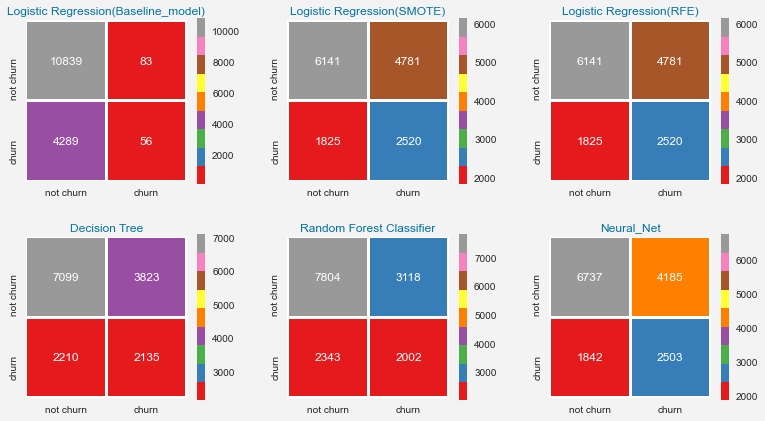

In [46]:
import itertools
lst    = [logit,logit_smote, logit_rfe, decision_tree, rfc, classifier]

length = len(lst)

mods   = ['Logistic Regression(Baseline_model)','Logistic Regression(SMOTE)', "Logistic Regression(RFE)",
          'Decision Tree','Random Forest Classifier', "Neural_Net"]

fig = plt.figure(figsize=(13,15))
fig.set_facecolor("#F3F3F3")
for i,j,k in itertools.zip_longest(lst,range(length),mods):
    if j == None:
        break
    else:
        plt.subplot(4,3, j+1)
        predictions = i.predict(X_test)
        if k == "Neural_Net":
            conf_matrix = confusion_matrix(y_test, predictions >0.5)
        else:
            conf_matrix = confusion_matrix(y_test, predictions)
        sns.heatmap(conf_matrix,annot=True,fmt = "d",square = True,
                    xticklabels=["not churn","churn"],
                    yticklabels=["not churn","churn"],
                    linewidths = 2,linecolor = "w",cmap = "Set1")
        plt.title(k,color = "b")
        plt.subplots_adjust(wspace = .3,hspace = .3)

## <a id='6.4'>6.4. ROC - Curves  for models</a>

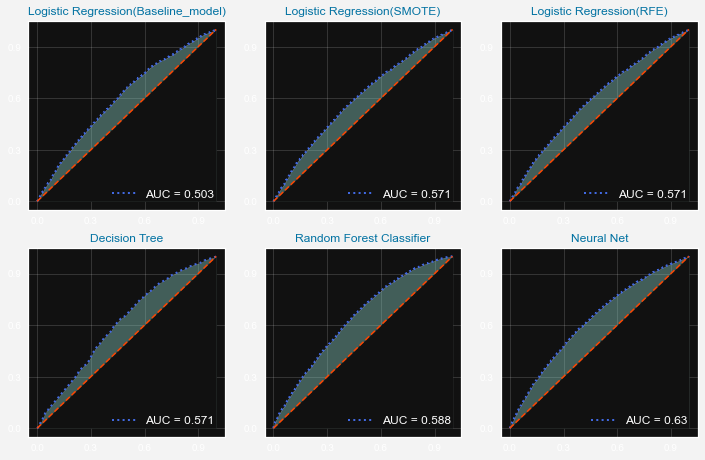

In [48]:
lst    = [logit,logit_smote, logit_rfe, decision_tree, rfc, classifier]

length = len(lst)

mods   = ['Logistic Regression(Baseline_model)','Logistic Regression(SMOTE)', "Logistic Regression(RFE)",
          'Decision Tree','Random Forest Classifier', "Neural Net"]

plt.style.use("dark_background")
fig = plt.figure(figsize=(12,16))
fig.set_facecolor("#F3F3F3")
for i,j,k in itertools.zip_longest(lst,range(length),mods) :
    qx = plt.subplot(4,3,j+1)
    probabilities = i.predict_proba(X_test)
    predictions   = i.predict(X_test)
    if k == "Neural Net":
        fpr,tpr,thresholds = roc_curve(y_test,probabilities)
    else:
        fpr,tpr,thresholds = roc_curve(y_test,probabilities[:,1])
    plt.plot(fpr,tpr,linestyle = "dotted",
             color = "royalblue",linewidth = 2,
             label = "AUC = " + str(np.around(roc_auc_score(y_test,predictions),3)))
    plt.plot([0,1],[0,1],linestyle = "dashed",
             color = "orangered",linewidth = 1.5)
    plt.fill_between(fpr,tpr,alpha = .4)
    plt.fill_between([0,1],[0,1],color = "k")
    plt.legend(loc = "lower right",
               prop = {"size" : 12})
    qx.set_facecolor("k")
    plt.grid(True,alpha = .15)
    plt.title(k,color = "b")
    plt.xticks(np.arange(0,1,.3))
    plt.yticks(np.arange(0,1,.3))

## <a id='6.5'>6.5. Precision recall curves</a>

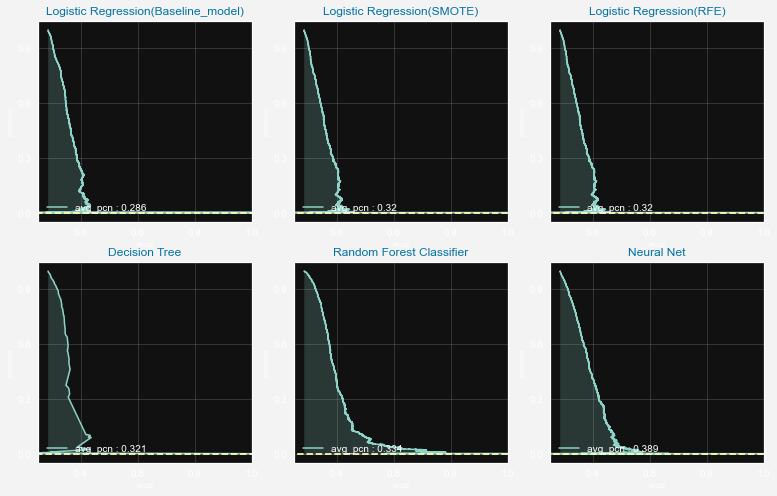

In [50]:
### from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score, precision_recall_curve


lst    = [logit,logit_smote, logit_rfe, decision_tree, rfc, classifier]

length = len(lst)

mods   = ['Logistic Regression(Baseline_model)','Logistic Regression(SMOTE)', "Logistic Regression(RFE)",
          'Decision Tree','Random Forest Classifier', "Neural Net"]

fig = plt.figure(figsize=(13,17))
fig.set_facecolor("#F3F3F3")
for i,j,k in itertools.zip_longest(lst,range(length),mods) :
    if j == None:
        break
    else:
        qx = plt.subplot(4,3,j+1)
        probabilities = i.predict_proba(X_test)          
        predictions   = i.predict(X_test)
        if k == "Neural Net":
            recall,precision,thresholds = precision_recall_curve(y_test,probabilities)
        else:
            recall,precision,thresholds = precision_recall_curve(y_test,probabilities[:,1])
        plt.plot(recall,precision,linewidth = 1.5,
                 label = ("avg_pcn : " + 
                          str(np.around(average_precision_score(y_test,predictions),3))))
        plt.plot([0,1],[0,0],linestyle = "dashed")
        plt.fill_between(recall,precision,alpha = .2)
        plt.legend(loc = "lower left",
                   prop = {"size" : 10})
        qx.set_facecolor("k")
        plt.grid(True,alpha = .15)
        plt.title(k,color = "b")
        plt.xlabel("recall",fontsize =7)
        plt.ylabel("precision",fontsize =7)
        plt.xlim([0.25,1])
        plt.yticks(np.arange(0,1,.3))
